In [5]:
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from patchify import patchify, unpatchify
import seaborn as sns
import random
import numpy as np
import math
from sklearn.model_selection import train_test_split
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import tensorflow as tf
import pickle
from tensorflow.keras.callbacks import LearningRateScheduler,ReduceLROnPlateau
from tensorflow.keras import models, layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, BatchNormalization, Activation, Flatten, Dense, Input, MaxPooling2D, Add, Reshape, concatenate, AveragePooling2D, Multiply, GlobalAveragePooling2D, UpSampling2D, MaxPool2D,Softmax
from tensorflow.keras.activations import softmax
from tensorflow.keras import initializers, regularizers
from tensorflow.keras.optimizers import Adam

from prediction import patches, prediction, psnr_and_ssim
from data_loader import Dataloader

# Importing Dataset

### Extracting image paths for SSID dataset

In [2]:
dir = os.listdir('datasets/SIDD_Medium_Srgb/Data')

folders = []
GT = []
Noisy = []

for folder in dir:
    folders.append(folder)

for folder in folders:
    files = os.listdir('datasets/SIDD_Medium_Srgb/Data/' + folder)
    for image in files:
        if image[5] == 'G':
            GT.append('datasets/SIDD_Medium_Srgb/Data/' + folder + '/' + image)
        else:
            Noisy.append('datasets/SIDD_Medium_Srgb/Data/' + folder + '/' + image)

In [3]:
df = pd.DataFrame()
df['Ground Truth Images'] = GT
df['Noisy Images'] = Noisy
df.head()

,Ground Truth Images,Noisy Images
0,datasets/SIDD_Medium_Srgb/Data/0001_001_S6_001...,datasets/SIDD_Medium_Srgb/Data/0001_001_S6_001...
1,datasets/SIDD_Medium_Srgb/Data/0001_001_S6_001...,datasets/SIDD_Medium_Srgb/Data/0001_001_S6_001...
2,datasets/SIDD_Medium_Srgb/Data/0002_001_S6_001...,datasets/SIDD_Medium_Srgb/Data/0002_001_S6_001...
3,datasets/SIDD_Medium_Srgb/Data/0002_001_S6_001...,datasets/SIDD_Medium_Srgb/Data/0002_001_S6_001...
4,datasets/SIDD_Medium_Srgb/Data/0003_001_S6_001...,datasets/SIDD_Medium_Srgb/Data/0003_001_S6_001...


 # Data Analysis

### Image Sizes

In [4]:
size = []
for i in range(len(df)):
    img_gt = cv2.imread(df['Ground Truth Images'].iloc[i])
    size.append(img_gt.shape)

df['image size'] = size
df['image size'] = df['image size'].astype(str)
df.head()

### Displaying few clean-noisy image pairs

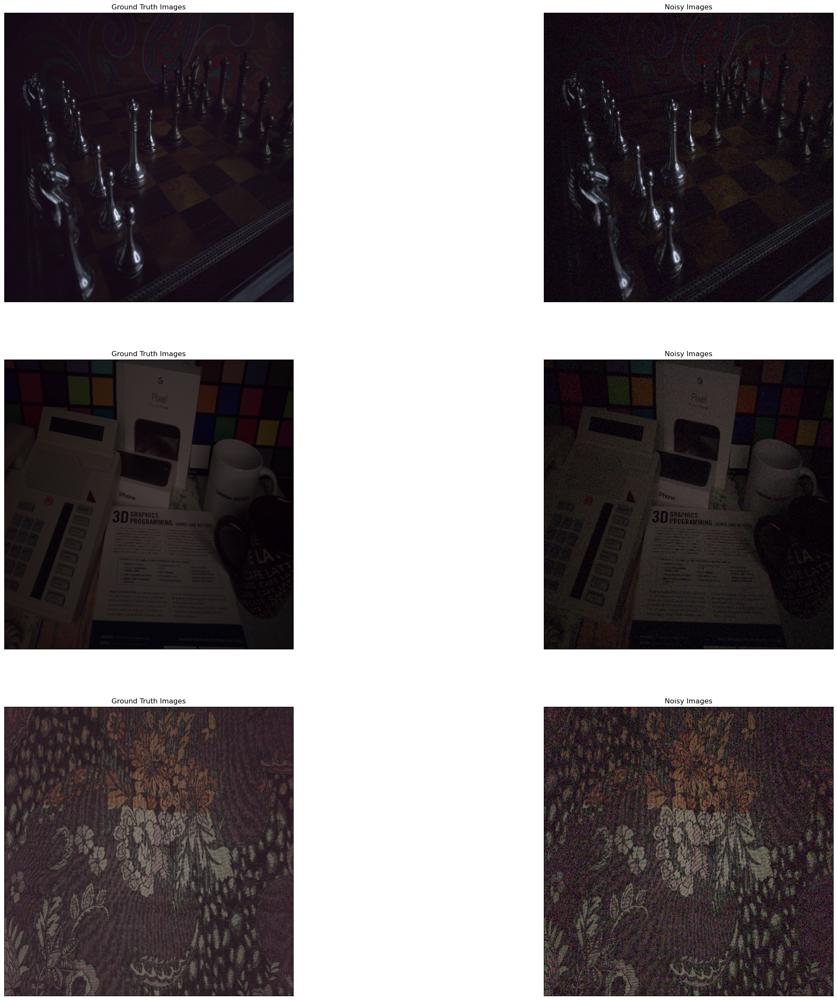

In [13]:
samples = df.sample(3)
fig, ax = plt.subplots(len(samples), 2, figsize=(30, 30))
for i in range(len(samples)):
    img = cv2.imread(samples['Ground Truth Images'].iloc[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (512, 512))
    ax[i][0].imshow(img)
    ax[i][0].get_yaxis().set_visible(False)
    ax[i][0].get_xaxis().set_visible(False)
    ax[i][0].title.set_text("Ground Truth Images")

    img = cv2.imread(samples['Noisy Images'].iloc[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (512, 512))
    ax[i][1].imshow(img)
    ax[i][1].get_xaxis().set_visible(False)
    ax[i][1].get_yaxis().set_visible(False)
    ax[i][1].title.set_text("Noisy Images")

### Splitting the dataset into test and train

In [14]:
X = df['Noisy Images']
y = df['Ground Truth Images']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
pickle.dump((X_train, y_train), open('train_path.pkl', 'wb'))
pickle.dump((X_test, y_test), open('test_path.pkl', 'wb'))

In [2]:
X_train, y_train = pickle.load(open('train_path.pkl', "rb"))
X_test, y_test = pickle.load(open('test_path.pkl', 'rb'))

### Creating Patches

In [5]:
X_train_patches = []
y_train_patches = []

for i in range(len(X_train)):
    path = X_train.iloc[i]
    img_nsy = cv2.imread(path)
    img_nsy = cv2.cvtColor(img_nsy, cv2.COLOR_BGR2RGB)
    img_nsy = cv2.resize(img_nsy, (1024, 1024))
    patches_nsy = patches(img_nsy, 256)

    path = X_train.iloc[i]
    img_gt = cv2.imread(path)
    img_gt = cv2.cvtColor(img_gt, cv2.COLOR_BGR2RGB)
    img_gt = cv2.resize(img_gt, (1024, 1024))
    patches_gt = patches(img_gt, 256)

    rows = patches_nsy.shape[0]
    cols = patches_nsy.shape[1]

    for j in range(rows):
        for k in range(cols):
            X_train_patches.append(patches_nsy[j][k][0])
            y_train_patches.append(patches_gt[j][k][0])

X_train = np.array(X_train_patches)
y_train = np.array(y_train_patches)

KeyboardInterrupt: 

In [17]:
X_test_patches = []
y_test_patches = []

for i in range(len(X_test)):
    path = X_test.iloc[i]
    img_nsy = cv2.imread(path)
    img_nsy = cv2.cvtColor(img_nsy, cv2.COLOR_BGR2RGB)
    img_nsy = cv2.resize(img_nsy,(1024,1024))  #resizing the X_test images
    patches_nsy = patches(img_nsy,256)

    path = y_test.iloc[i]
    img_gt = cv2.imread(path)
    img_gt = cv2.cvtColor(img_gt, cv2.COLOR_BGR2RGB)
    img_gt = cv2.resize(img_gt,(1024,1024))  #resizing the y_test images
    patches_gt = patches(img_gt,256)

    rows = patches_nsy.shape[0]
    cols = patches_nsy.shape[1]

    for j in range(rows):
        for k in range(cols):
            X_test_patches.append(patches_nsy[j][k][0])
            y_test_patches.append(patches_gt[j][k][0])

X_test = np.array(X_test_patches)
y_test = np.array(y_test_patches)

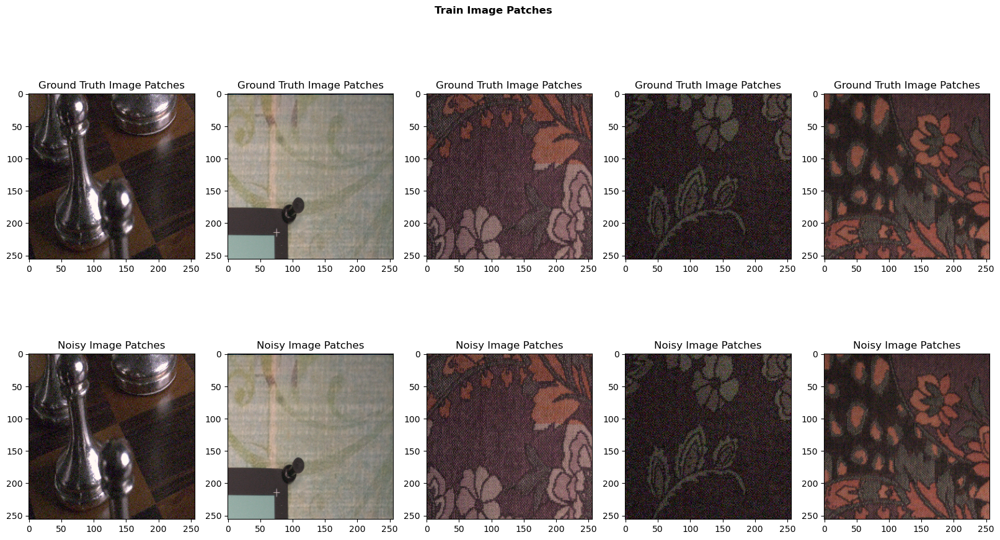

In [22]:
fig, axs = plt.subplots(2,5,figsize=(20,10))
r = random.sample(range(0, 2048), 5)

fig.suptitle('Train Image Patches',fontweight ="bold")
for i in range(5):
    axs[0][i].imshow(y_train[r[i]])
    axs[0][i].set_title('Ground Truth Image Patches')
    axs[1][i].imshow(X_train[r[i]])
    axs[1][i].set_title('Noisy Image Patches')

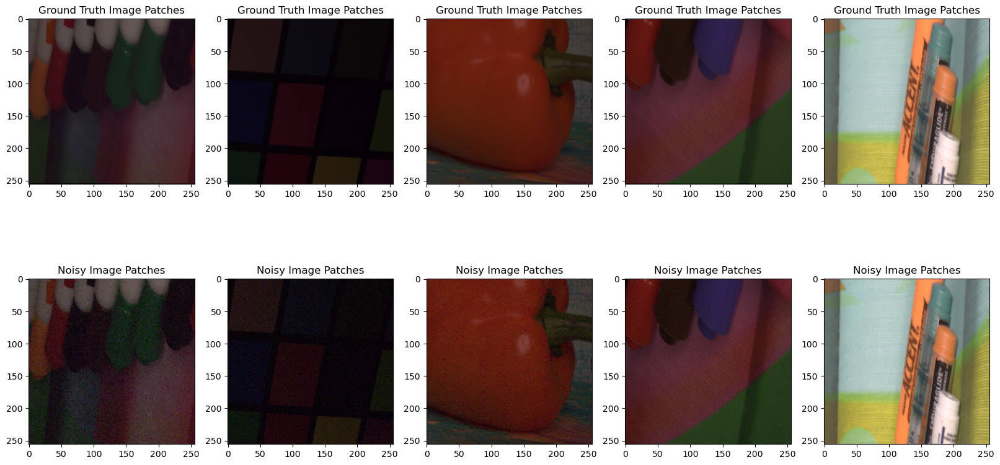

In [30]:
fig, axs = plt.subplots(2,5,figsize=(20,10))
r = random.sample(range(0, 512), 5)

for i in range(5):
    axs[0][i].imshow(y_test[r[i]])
    axs[0][i].set_title('Ground Truth Image Patches')
    axs[1][i].imshow(X_test[r[i]])
    axs[1][i].set_title('Noisy Image Patches')

In [18]:
print("Total number of image patches on train data : ", len(X_train))
print("Total number of image patches on test data : ", len(X_test))

Total number of image patches on train data :  4096
Total number of image patches on test data :  1024
